# **Dataset Download and Preparation**


In [ ]:
# === SETUP FOR STANFORD DOGS NOTEBOOK ===
from google.colab import drive
drive.mount('/content/drive')

#  Create a project folder in Google Drive (to save data & models)
import os
PROJECT_DIR = '/content/drive/MyDrive/stanford_dogs_colab'
os.makedirs(PROJECT_DIR, exist_ok=True)
print("Project folder created:", PROJECT_DIR)



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Project folder created: /content/drive/MyDrive/stanford_dogs_colab


In [ ]:
# === DOWNLOAD STANFORD DOGS DATASET ===
import os
import tarfile
import urllib.request

DATA_DIR = os.path.join(PROJECT_DIR, 'dataset')
os.makedirs(DATA_DIR, exist_ok=True)

# URLs for images and annotations
urls = {
    "images": "http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar",
    "annotations": "http://vision.stanford.edu/aditya86/ImageNetDogs/annotation.tar"
}

for name, url in urls.items():
    file_path = os.path.join(DATA_DIR, f"{name}.tar")
    if not os.path.exists(file_path.replace(".tar", "")):  # skip if already extracted
        print(f"Downloading {name}...")
        urllib.request.urlretrieve(url, file_path)
        print(f"Extracting {name}...")
        with tarfile.open(file_path) as tar:
            tar.extractall(DATA_DIR)
        print(f"{name} done.")
    else:
        print(f"{name} already downloaded and extracted.")

print("Dataset ready in:", DATA_DIR)

In [ ]:
annotations_dir = '/content/drive/MyDrive/stanford_dogs_colab/dataset/Annotation'
images_dir = '/content/drive/MyDrive/stanford_dogs_colab/dataset/Images'

In [ ]:
# Exécutez d'abord ces commandes
!pip install --upgrade tensorflow keras

# Puis redémarrez le runtime (Runtime -> Restart runtime)

In [ ]:
!pip install -q gradio keras-tuner

In [ ]:
# === IMPORTS + check GPU ===
import warnings, numpy as np, pandas as pd, matplotlib.pyplot as plt, cv2 as cv, timeit, seaborn as sns
import os
import warnings
import matplotlib.image as mpimg
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as K
import kerastuner as kt
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
import gradio as gr

warnings.filterwarnings('ignore')

device_name = tf.test.gpu_device_name()
if "GPU" not in device_name:
    print(" GPU not found")
else:
    print(" Found GPU:", device_name)


/tmp/ipython-input-2542324989.py:15: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  import kerastuner as kt


 Found GPU: /device:GPU:0


In [ ]:
# Import libraries
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import timeit
import cv2 as cv
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as K
import kerastuner as kt
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
import gradio as gr

# **Data Exploration**


In [7]:
# Count the number of classes (dogs breeds)
breed_list = os.listdir(images_dir)
breed_counts = {breed: len(os.listdir(os.path.join(images_dir, breed))) for breed in breed_list}
breed_counts = dict(sorted(breed_counts.items(), key=lambda x: x[1], reverse=True))
print("Number of breeds in dataset:", (len(breed_list)))

Number of breeds in dataset: 120


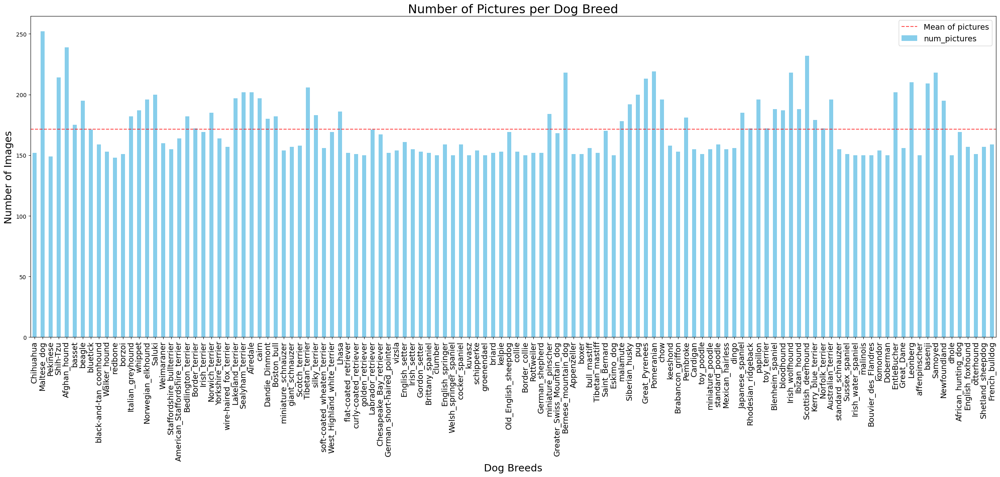

In [ ]:
# List breeds and count images per breed
breed_list = os.listdir(images_dir)

# Data preparation: Creating a DataFrame with breed names and image counts
df_breeds = pd.DataFrame(
    index=[breed.split('-', 1)[1] for breed in breed_list],
    data=[len(os.listdir(os.path.join(images_dir, breed))) for breed in breed_list],
    columns=["num_pictures"]
)

# Bar plot of number of pictures per breed
fig, ax = plt.subplots(figsize=(25, 12))  # Increased width of the chart

# Plot the data with a single color
df_breeds.plot(kind="bar", legend=False, ax=ax, color='skyblue')

# Add a horizontal line for the mean number of pictures
ax.axhline(df_breeds["num_pictures"].mean(), color='r', alpha=.7, linestyle='--', label="Mean of pictures")

# Title and axis labels
plt.title("Number of Pictures per Dog Breed", fontsize=22)
plt.xlabel("Dog Breeds", fontsize=18)
plt.ylabel("Number of Images", fontsize=18)

# Rotate x-axis labels to vertical and adjust spacing
plt.xticks(rotation=90, ha='center', fontsize=14)

# Add legend and fine-tune layout for better label positioning
plt.legend(loc='upper right', fontsize=14)
plt.tight_layout()  # Ensures labels are not cut off
plt.show()

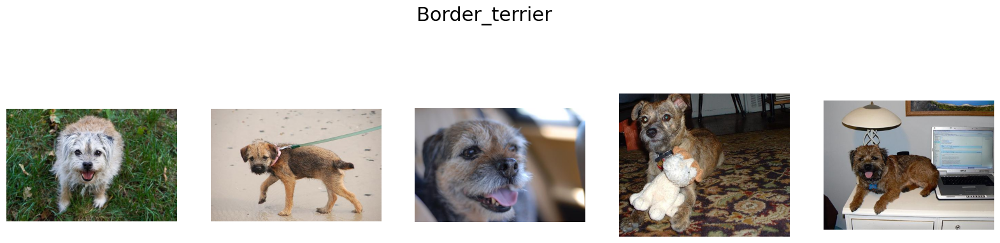

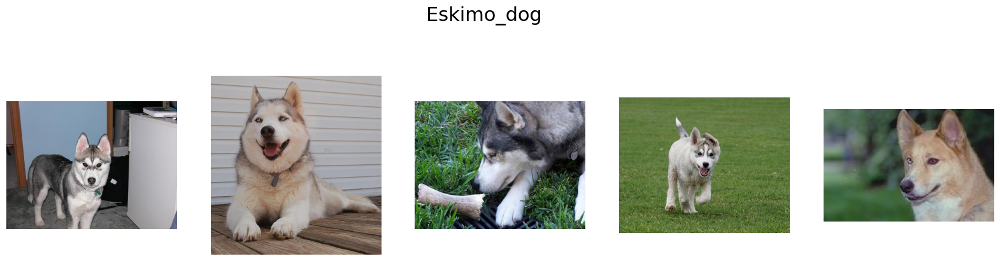

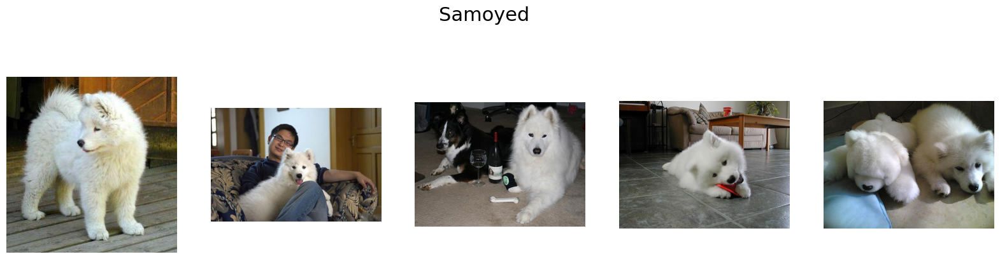

In [ ]:
# Function to display random images from the entire dataset
def show_random_images(images_dir, num_samples=5, num_breeds=3):
    """
    Displays random images from different breeds.

    Parameters:
    images_dir (str): Path to the image directory
    num_samples (int): Number of images to show per breed
    num_breeds (int): Number of random breeds to display
    """
    breed_list = os.listdir(images_dir)

    # Display random images from 3 random breeds
    for i in np.random.randint(0, len(breed_list), size=num_breeds):
        show_images_classes(images_dir, breed_list[i], num_samples)

# Call the function to show 5 random images from 3 random breeds
show_random_images(images_dir, num_samples=5, num_breeds=3)


In [ ]:
# === Select top 10 breeds with most images ===
selected_breeds = list(breed_counts.keys())[:10]
print(f" Selected top 10 breeds ({len(selected_breeds)}):")
for b in selected_breeds:
    print(f"{b.split('-')[1]} → {breed_counts[b]} images")

 Selected top 10 breeds (10):
Maltese_dog → 252 images
Afghan_hound → 239 images
Scottish_deerhound → 232 images
Pomeranian → 219 images
Bernese_mountain_dog → 218 images
Irish_wolfhound → 218 images
Samoyed → 218 images
Shih → 214 images
Great_Pyrenees → 213 images
Leonberg → 210 images


In [ ]:


# List all breeds (folders) in the images directory
breed_list = os.listdir(images_dir)

# Create a DataFrame for the number of images per breed
df_breeds = pd.DataFrame(
    index=[breed.split('-', 1)[1] for breed in breed_list],
    data=[len(os.listdir(os.path.join(images_dir, breed))) for breed in breed_list],
    columns=["num_pictures"]
)

# Display the number of images per breed
df_breeds_sorted = df_breeds.sort_values(by="num_pictures", ascending=False)
df_breeds_sorted.head(10)  # Show the top 10 breeds with most images


,num_pictures
Maltese_dog,252
Afghan_hound,239
Scottish_deerhound,232
Pomeranian,219
Bernese_mountain_dog,218
Irish_wolfhound,218
Samoyed,218
Shih-Tzu,214
Great_Pyrenees,213
Leonberg,210


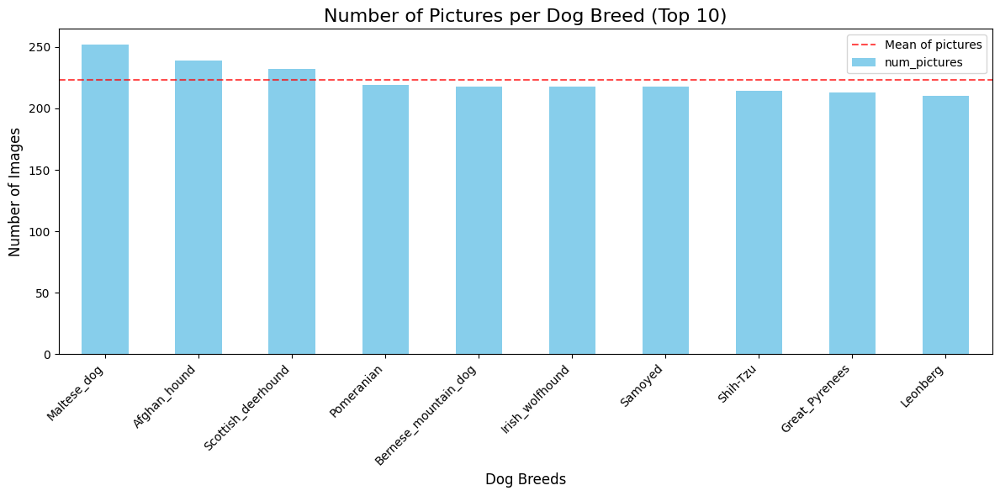

In [ ]:
# Plot the number of images per breed with better readability
fig, ax = plt.subplots(figsize=(12,6))  # Adjusted figure size

# Limit to top 10 breeds for clearer visualization
df_top_10 = df_breeds_sorted.head(10)

df_top_10.plot(kind="bar", legend=False, ax=ax, color='skyblue')

# Plot the mean line
ax.axhline(df_top_10["num_pictures"].mean(), color='r', alpha=.7, linestyle='--', label="Mean of pictures")

# Set title and labels
plt.title("Number of Pictures per Dog Breed (Top 10)", fontsize=16)
plt.xlabel("Dog Breeds", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right", fontsize=10)

# Add legend and show the plot
plt.legend()
plt.tight_layout()  # Adjust layout to avoid label clipping
plt.show()


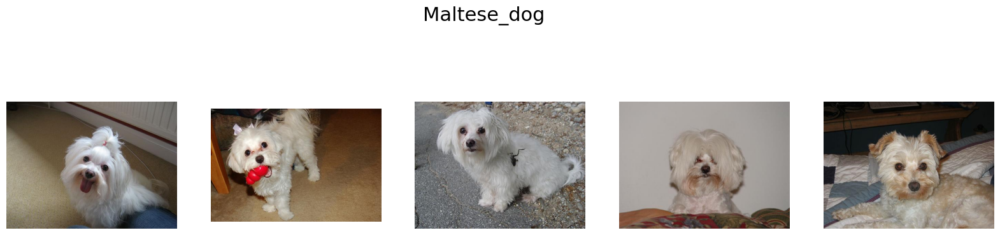

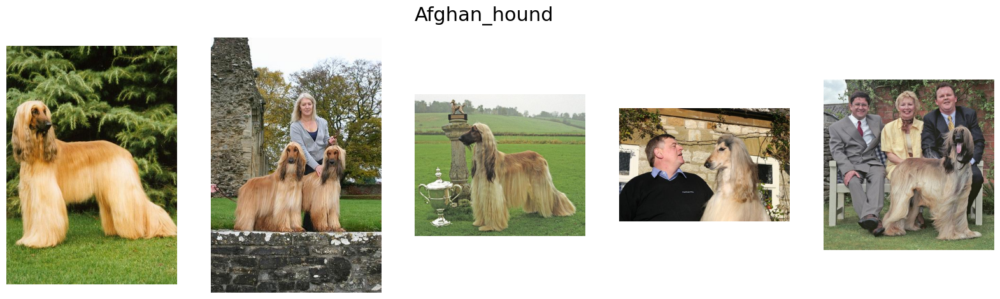

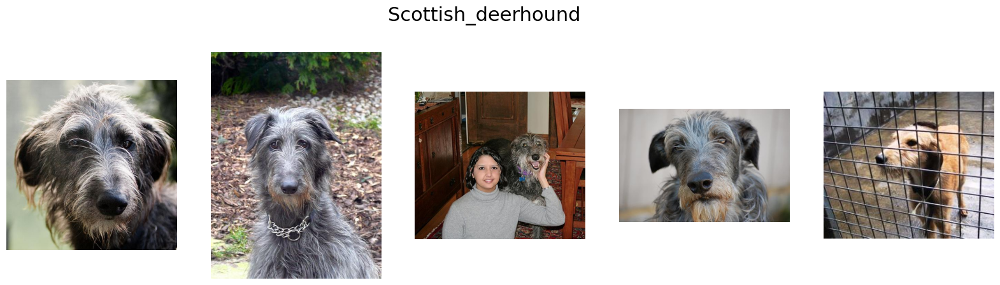

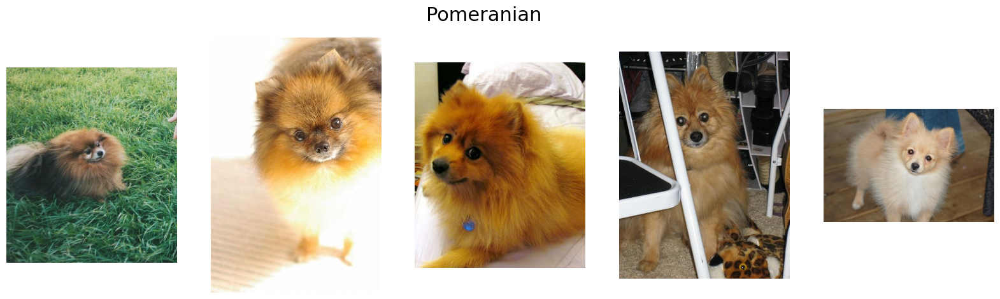

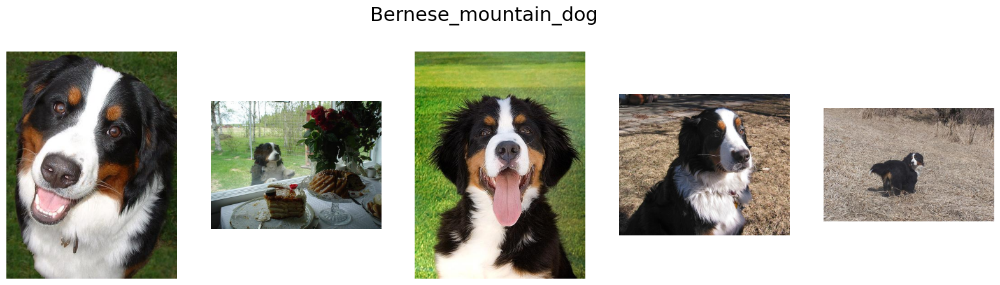

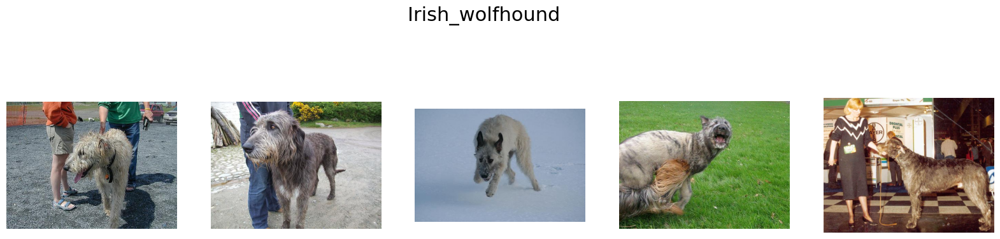

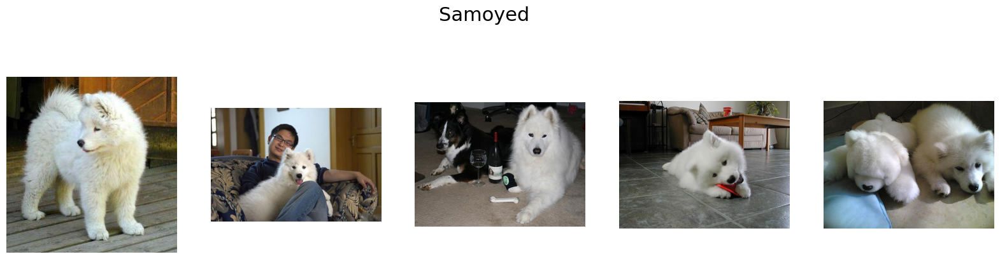

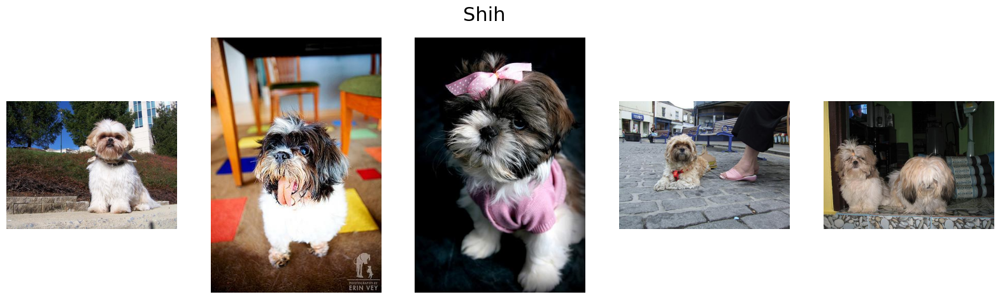

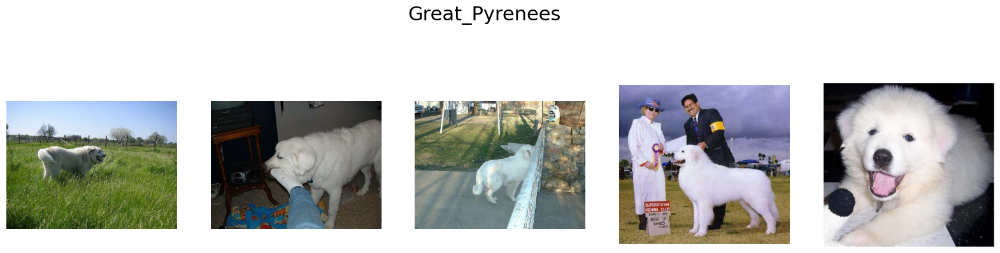

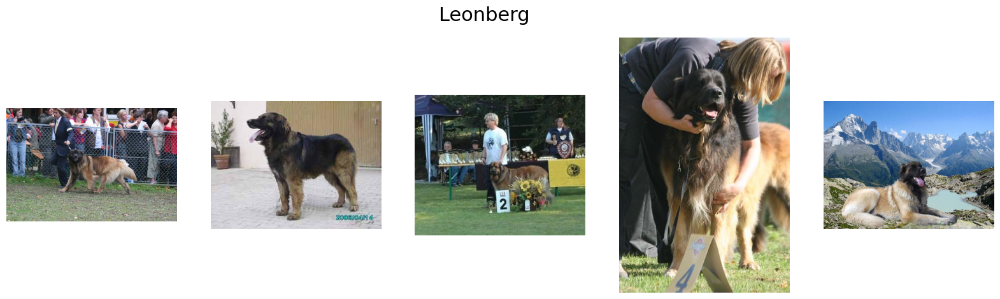

In [ ]:
# Display a few images from each of the top 10 breeds
def show_top_10_images(images_dir, top_10_breeds, num_samples=5):
    """
    Displays a few images from each of the top 10 selected breeds.

    Parameters:
    images_dir (str): Path to the image directory
    top_10_breeds (list): List of top 10 breeds
    num_samples (int): Number of images to display per breed
    """
    for breed in top_10_breeds:
        show_images_classes(images_dir, breed, num_samples)

# Call the function to show 5 images from each of the top 10 breeds
show_top_10_images(images_dir, selected_breeds, num_samples=5)

## **Data Preprocessing**

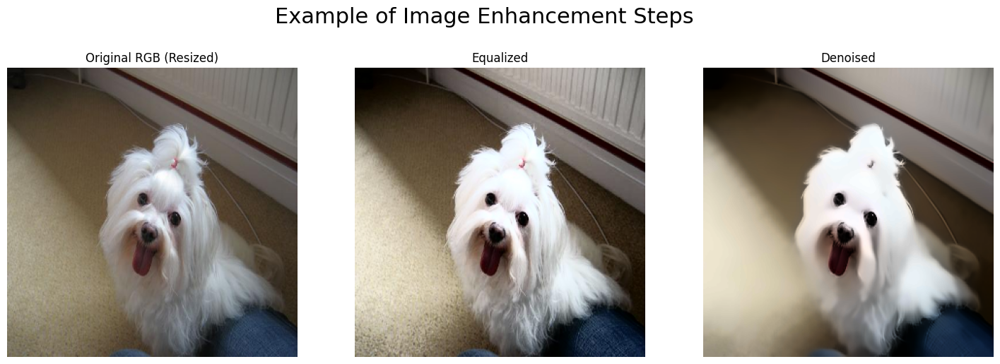

In [ ]:
# ============================================================
# === Example of Enhancement on a Single Image (for report)
# ============================================================
img_test_path = os.path.join(images_dir, selected_breeds[0], os.listdir(os.path.join(images_dir, selected_breeds[0]))[0])
img_test = cv.imread(img_test_path)

# Convert to RGB and Resize
img_rgb = cv.cvtColor(img_test, cv.COLOR_BGR2RGB)
resized_img = cv.resize(img_rgb, (299, 299), interpolation=cv.INTER_LINEAR)

# Equalization
img_yuv = cv.cvtColor(resized_img, cv.COLOR_RGB2YUV)
img_yuv[:, :, 0] = cv.equalizeHist(img_yuv[:, :, 0])
img_equ = cv.cvtColor(img_yuv, cv.COLOR_YUV2RGB)

# Denoising
img_denoised = cv.fastNlMeansDenoisingColored(img_equ, None, h=10, hColor=10, templateWindowSize=7, searchWindowSize=21)

# Compare visually
fig, axs = plt.subplots(1, 3, figsize=(18,6))
axs[0].imshow(resized_img); axs[0].set_title("Original RGB (Resized)")
axs[1].imshow(img_equ); axs[1].set_title("Equalized")
axs[2].imshow(img_denoised); axs[2].set_title("Denoised")
for ax in axs: ax.axis("off")
plt.suptitle("Example of Image Enhancement Steps", fontsize=22)
plt.show()

In [ ]:
# ============================================================
# ===  Define Preprocessing Function (Batch for All Images)
# ============================================================
def preprocessing_cnn(directories, img_width, img_height):
    """
    Preprocessing pipeline for CNN input:
    - RGB conversion
    - Resizing
    - Histogram equalization
    - Denoising
    - Normalization (0–1)
    """
    img_list = []
    labels = []
    for breed in directories:
        for image_name in os.listdir(os.path.join(images_dir, breed)):
            # Read and convert
            img = cv.imread(os.path.join(images_dir, breed, image_name))
            img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

            # Resize
            img = cv.resize(img, (img_width, img_height), interpolation=cv.INTER_LINEAR)

            # Equalize
            img_yuv = cv.cvtColor(img, cv.COLOR_RGB2YUV)
            img_yuv[:, :, 0] = cv.equalizeHist(img_yuv[:, :, 0])
            img_equ = cv.cvtColor(img_yuv, cv.COLOR_YUV2RGB)

            # Denoise
            img_denoised = cv.fastNlMeansDenoisingColored(img_equ, None, 10, 10, 7, 21)

            # Convert to array and normalize
            img_array = image.img_to_array(img_denoised) / 255.0

            img_list.append(img_array)
            labels.append(breed.split("-")[1])
    return np.array(img_list), np.array(labels)


In [ ]:
# ============================================================
# ===  Apply Preprocessing to the 20 Selected Breeds
# ============================================================

start_time = timeit.default_timer()
X, y = preprocessing_cnn(selected_breeds, 299, 299)
X = np.array(X)
y = np.array(y)
elapsed = timeit.default_timer() - start_time

print(" Preprocessing complete")
print("Number of images:", len(y))
print("Shape of X:", X.shape)
print("Time elapsed: {:.2f}s".format(elapsed))


✅ Preprocessing complete
Number of images: 2233
Shape of X: (2233, 299, 299, 3)
Time elapsed: 742.06s


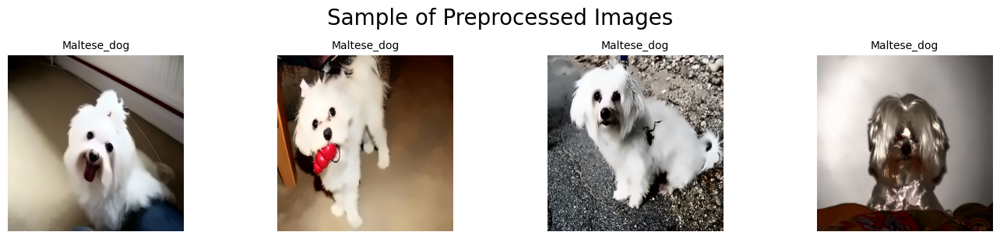

In [ ]:
# === Preview Sample of Preprocessed Images ===
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 8))
for i in range(4):
    plt.subplot(3, 4, i+1)
    plt.imshow(X[i])  # images already normalized to [0,1]
    plt.title(y[i], fontsize=10)
    plt.axis('off')

plt.suptitle("Sample of Preprocessed Images", fontsize=20)
plt.tight_layout()
plt.show()


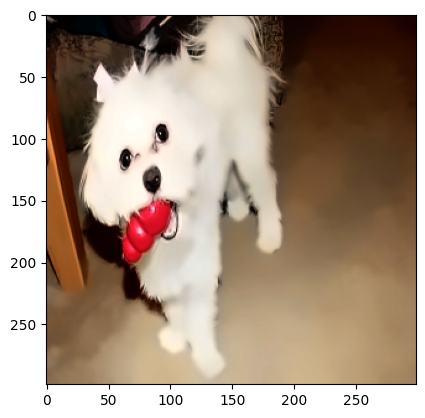

In [ ]:
# Show exemple preprocessed image
plt.imshow(image.array_to_img(X[1]))

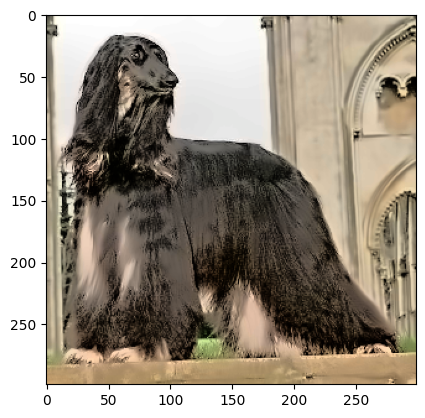

In [ ]:
# Show exemple preprocessed image
plt.imshow(image.array_to_img(X[420]))

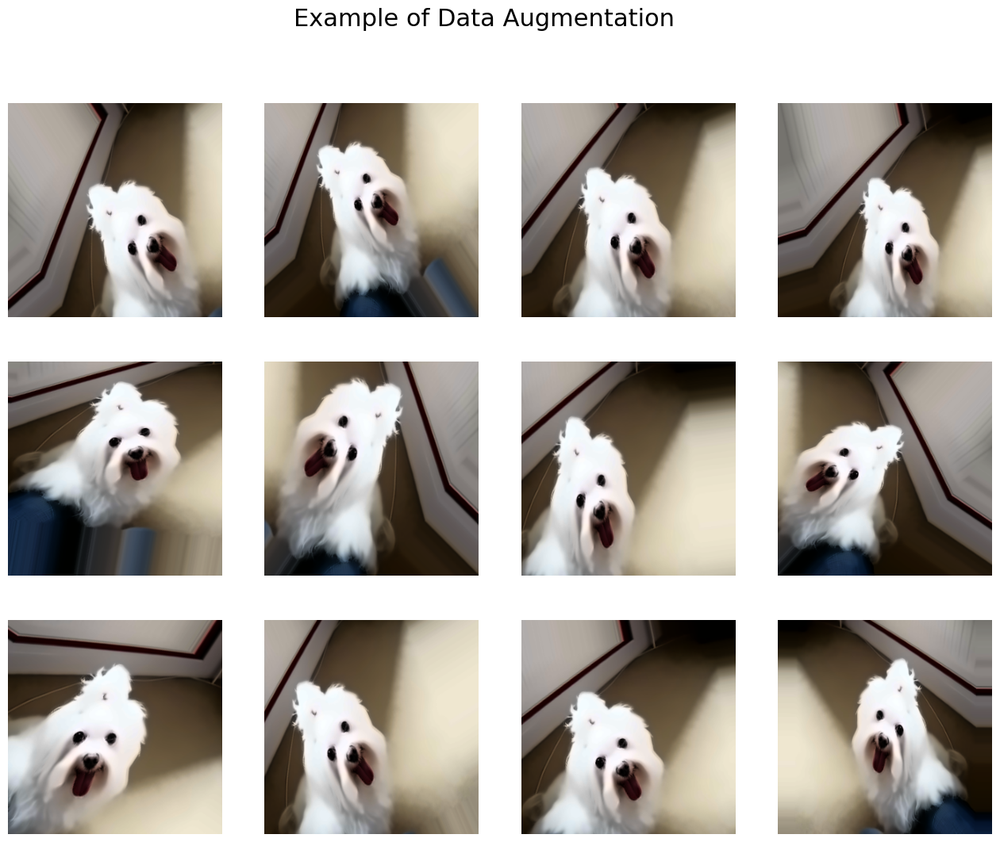

In [ ]:
# ============================================================
# ===  Data Augmentation Setup (For Model Training)
# ============================================================
augmented_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# === Preview Example Augmentations ===
x = X[0].reshape((1,) + X[0].shape)
fig = plt.figure(figsize=(16,12))
for i, batch in enumerate(augmented_datagen.flow(x, batch_size=1)):
    plt.subplot(3,4,i+1)
    plt.imshow(image.array_to_img(batch[0]))
    plt.axis("off")
    if i == 11:
        break
plt.suptitle("Example of Data Augmentation", fontsize=22)
plt.show()

# **Saving Preprocessed Data to Drive**

In [ ]:
import numpy as np
import os

# Save the preprocessed images (X) and labels (y) as .npy files
np.save(os.path.join(PROJECT_DIR, "X_preprocessed.npy"), X)
np.save(os.path.join(PROJECT_DIR, "y_preprocessed.npy"), y)

print(" Preprocessed data saved to Drive.")


 Preprocessed data saved to Drive.


# **Loading Preprocessed Data from Drive**

In [8]:
# Load the preprocessed images (X) and labels (y) from .npy files
X = np.load(os.path.join(PROJECT_DIR, "X_preprocessed.npy"))
y = np.load(os.path.join(PROJECT_DIR, "y_preprocessed.npy"))

print("Preprocessed data loaded from Drive.")


Preprocessed data loaded from Drive.


# **CNN model From scratch**

In [9]:
# Using np.shuffle
img_space = np.arange(X.shape[0])
np.random.seed(8)
# Shuffle the space
np.random.shuffle(img_space)
# Apply to X and y in same order
X = X[img_space]
y = y[img_space]








In [10]:
# Change X type
X = X.astype(np.float32)
# Encode y text data in numeric
encoder = LabelEncoder()
encoder.fit(y)
y = encoder.transform(y)



# Verifie encoder created classes
print(encoder.classes_)






['Afghan_hound' 'Bernese_mountain_dog' 'Great_Pyrenees' 'Irish_wolfhound'
 'Leonberg' 'Maltese_dog' 'Pomeranian' 'Samoyed' 'Scottish_deerhound'
 'Shih']


In [11]:
from sklearn.model_selection import train_test_split
### Create train and test set
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

print("-" * 50)
print("Size of created sets :")
print("-" * 50)
print("Train set size = ",x_train.shape[0])
print("Test set size = ",x_test.shape[0])


--------------------------------------------------
Size of created sets :
--------------------------------------------------
Train set size =  1786
Test set size =  447


In [12]:
# Data generator on train set with Data Augmentation
# Validation set is define here
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2)

#For validation and test, just rescale
test_datagen = ImageDataGenerator(rescale=1./255)

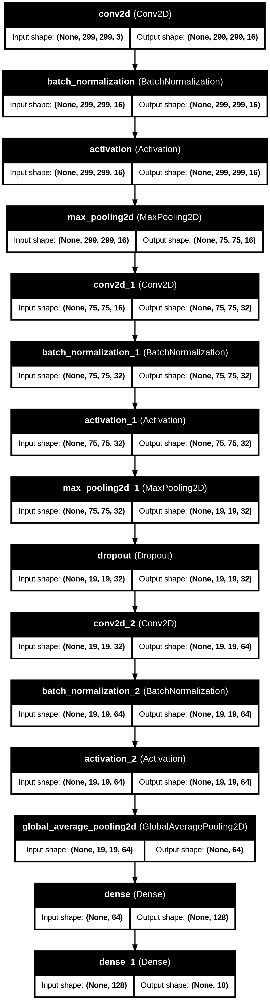

In [13]:

num_breeds=10
K.clear_session()
model = Sequential()
# Convolution layer
model.add(Conv2D(filters=16,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False,
                 input_shape=(299,299,3)))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
# Pooling layer
model.add(MaxPooling2D(pool_size=(4, 4),
                       strides=(4, 4),
                       padding='same'))
# Second convolution layer
model.add(Conv2D(filters=32,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))
# Third convolution layer
model.add(Conv2D(filters=64,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(GlobalAveragePooling2D())
# Fully connected layers
model.add(Dense(128, activation='relu'))
model.add(Dense(num_breeds, activation='softmax'))
plot_model(model, to_file='CNN_model_plot.png',
           show_shapes=True, show_layer_names=True)


In [14]:
from tensorflow.keras.metrics import SparseTopKCategoricalAccuracy

model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["sparse_categorical_accuracy",
             SparseTopKCategoricalAccuracy(k=3, name='top3_acc')]
)


In [16]:
#CNN Model training
history = model.fit(
    train_datagen.flow(x_train, y_train, batch_size=16, subset='training', shuffle=True),
    validation_data=train_datagen.flow(x_train, y_train, batch_size=16, subset='validation', shuffle=False),
    epochs=20,
    verbose=2
)


Epoch 1/20
90/90 - 46s - 506ms/step - loss: 1.9322 - sparse_categorical_accuracy: 0.3009 - top3_acc: 0.6067 - val_loss: 2.1347 - val_sparse_categorical_accuracy: 0.2241 - val_top3_acc: 0.5098
Epoch 2/20
90/90 - 43s - 482ms/step - loss: 1.9173 - sparse_categorical_accuracy: 0.3163 - top3_acc: 0.6284 - val_loss: 2.6342 - val_sparse_categorical_accuracy: 0.1345 - val_top3_acc: 0.3669
Epoch 3/20
90/90 - 42s - 462ms/step - loss: 1.8884 - sparse_categorical_accuracy: 0.3163 - top3_acc: 0.6403 - val_loss: 2.5610 - val_sparse_categorical_accuracy: 0.1429 - val_top3_acc: 0.3249
Epoch 4/20
90/90 - 42s - 466ms/step - loss: 1.8843 - sparse_categorical_accuracy: 0.3079 - top3_acc: 0.6501 - val_loss: 2.2425 - val_sparse_categorical_accuracy: 0.2269 - val_top3_acc: 0.5042
Epoch 5/20
90/90 - 42s - 464ms/step - loss: 1.8628 - sparse_categorical_accuracy: 0.3212 - top3_acc: 0.6501 - val_loss: 2.2503 - val_sparse_categorical_accuracy: 0.2213 - val_top3_acc: 0.4426
Epoch 6/20
90/90 - 42s - 467ms/step - lo

In [17]:
# === SAVE CNN ARTIFACTS (model + history + classes + test set) ===
import os, json
import numpy as np
import pandas as pd

cnn_dir = os.path.join(PROJECT_DIR, "artifacts_cnn")
os.makedirs(cnn_dir, exist_ok=True)

# 1) Model (architecture + weights)
cnn_model_path = os.path.join(cnn_dir, "cnn_model.keras")
model.save(cnn_model_path)

# 2) Training history (for plots later)
H_cnn = history.history if hasattr(history, "history") else {}
with open(os.path.join(cnn_dir, "history.json"), "w") as f:
    json.dump(H_cnn, f)
pd.DataFrame(H_cnn).to_csv(os.path.join(cnn_dir, "history.csv"), index=False)

# 3) Label classes (for confusion matrix/report later)
np.save(os.path.join(cnn_dir, "label_classes.npy"), encoder.classes_)

# 4) Test split (so you can evaluate/plot later without re-splitting)
np.save(os.path.join(cnn_dir, "x_test.npy"), x_test)
np.save(os.path.join(cnn_dir, "y_test.npy"), y_test)

print("Saved CNN model to:", cnn_model_path)
print("History keys:", list(H_cnn.keys()))
print("Artifacts folder:", cnn_dir)



Saved CNN model to: /content/drive/MyDrive/stanford_dogs_colab/artifacts_cnn/cnn_model.keras
History keys: ['loss', 'sparse_categorical_accuracy', 'top3_acc', 'val_loss', 'val_sparse_categorical_accuracy', 'val_top3_acc']
Artifacts folder: /content/drive/MyDrive/stanford_dogs_colab/artifacts_cnn


In [39]:
import matplotlib.pyplot as plt

def _resolve_key(H, name):
    if name in H: return name
    aliases = {
        "accuracy": ["sparse_categorical_accuracy", "categorical_accuracy"],
        "top3_acc": ["top3_acc", "sparse_top_k_categorical_accuracy"],
        "loss":     ["loss"],
    }
    for cand in aliases.get(name, []):
        if cand in H: return cand
    for k in H.keys():
        if name in k: return k
    raise KeyError(f"'{name}' not found. Available: {sorted(H.keys())}")

def _pretty_name(metric_key_or_alias):
    mapping = {
        "accuracy": "Accuracy",
        "sparse_categorical_accuracy": "Accuracy",
        "categorical_accuracy": "Accuracy",
        "top3_acc": "Top-3 Accuracy",
        "sparse_top_k_categorical_accuracy": "Top-3 Accuracy",
        "loss": "Loss",
    }
    return mapping.get(metric_key_or_alias, metric_key_or_alias)

def plot_one_metric(history, metric_name,
                    title=None,
                    train_color="#2a9d8f",
                    val_color="#e76f51",
                    ylim=(0,1)):
    H = history.history
    m = _resolve_key(H, metric_name)
    vm = f"val_{m}" if f"val_{m}" in H else None

    pretty = _pretty_name(metric_name)  # use the alias user passed for label text

    plt.figure(figsize=(12,6))
    plt.plot(H[m], label=f"Training {pretty}", color=train_color, linewidth=2)
    if vm:
        plt.plot(H[vm], label=f"Validation {pretty}", color=val_color, linestyle='--', linewidth=2)
    plt.title(title or f"{pretty} (Train vs Validation)")
    plt.xlabel("Epoch"); plt.ylabel(pretty)
    if ylim and pretty.lower() != "loss":
        plt.ylim(*ylim)
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


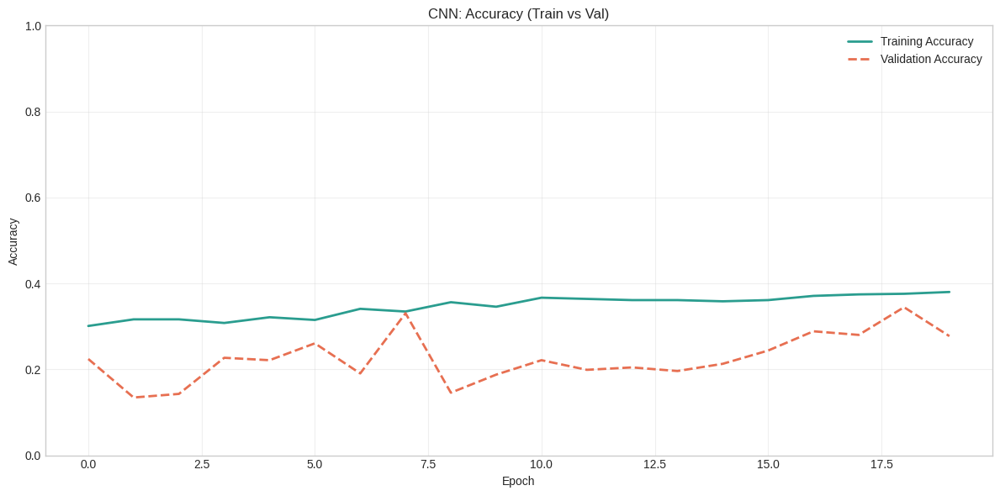

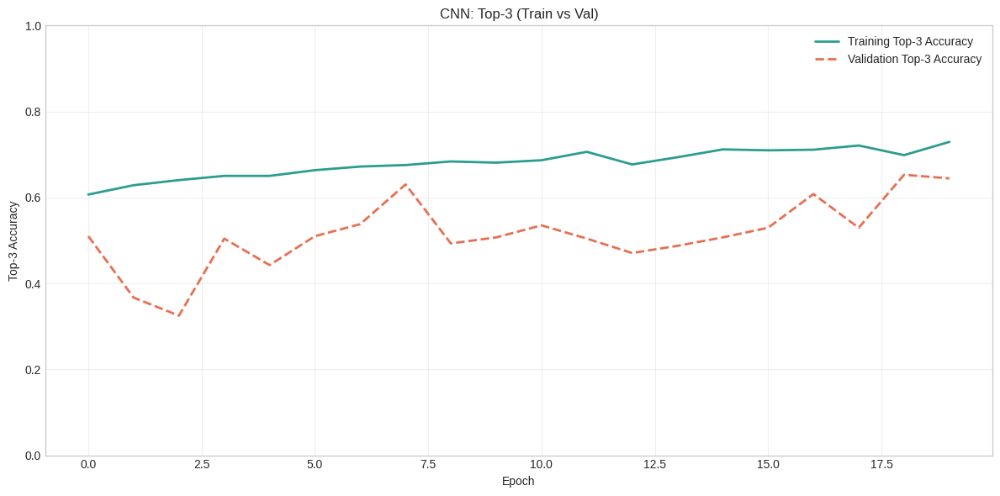

In [40]:
plot_one_metric(history, "accuracy",  title="CNN: Accuracy (Train vs Val)")
plot_one_metric(history, "top3_acc",  title="CNN: Top-3 (Train vs Val)")

# **Xception Model**

In [18]:

from tensorflow.keras import backend as K
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout

K.clear_session()  # clear previous models from memory

# Load pretrained Xception without top layers
xception_model = Xception(
    weights='imagenet',
    include_top=False,   # remove the old classifier
    pooling='avg',       # use global average pooling
    input_shape=(299, 299, 3)
)

# Summary: number of layers
print("-" * 50)
print("Xception base model loaded successfully.")
print(f"Number of layers: {len(xception_model.layers)}")
print("-" * 50)





83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
--------------------------------------------------
Xception base model loaded successfully.
Number of layers: 133
--------------------------------------------------


In [19]:
###Freezing pretrained layers



for layer in xception_model.layers:
    layer.trainable = False




In [20]:
from tensorflow.keras import Model
from tensorflow.keras.layers import Dense, Dropout

num_breeds = 10

base_output = xception_model.output
base_output = Dense(128, activation='relu')(base_output)
base_output = Dropout(0.2)(base_output)
predictions = Dense(num_breeds, activation='softmax')(base_output)

my_xcept_model = Model(inputs=xception_model.input, outputs=predictions)
my_xcept_model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["sparse_categorical_accuracy",
             SparseTopKCategoricalAccuracy(k=3, name='top3_acc')]
)


In [21]:

from tensorflow.keras.utils import plot_model

Xception_plot = plot_model(my_xcept_model,
                           to_file='xcept_model_plot.png',
                           show_shapes=True,
                           show_layer_names=False)

In [22]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf

# Data generator on train set with Data Augmentation (NO preprocessing_function)
train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2
)

# For validation and test, same (no extra preprocessing, your X is already in [0,1])
test_datagen = ImageDataGenerator()


In [ ]:
#Trainin Xception
history_xcept = my_xcept_model.fit(
    train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='training',
        shuffle=True),
    validation_data=train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_train) // 16,
    epochs=20,
    verbose=2
)


Epoch 1/20
111/111 - 143s - 1s/step - loss: 0.8590 - sparse_categorical_accuracy: 0.7292 - top3_acc: 0.9048 - val_loss: 0.4618 - val_sparse_categorical_accuracy: 0.8571 - val_top3_acc: 0.9524
Epoch 2/20
111/111 - 57s - 517ms/step - loss: 0.4765 - sparse_categorical_accuracy: 0.8369 - top3_acc: 0.9720 - val_loss: 0.4074 - val_sparse_categorical_accuracy: 0.8375 - val_top3_acc: 0.9776
Epoch 3/20
111/111 - 48s - 432ms/step - loss: 0.4248 - sparse_categorical_accuracy: 0.8537 - top3_acc: 0.9727 - val_loss: 0.3973 - val_sparse_categorical_accuracy: 0.8431 - val_top3_acc: 0.9692
Epoch 4/20
111/111 - 45s - 404ms/step - loss: 0.3793 - sparse_categorical_accuracy: 0.8677 - top3_acc: 0.9825 - val_loss: 0.3288 - val_sparse_categorical_accuracy: 0.8768 - val_top3_acc: 0.9776
Epoch 5/20
111/111 - 45s - 406ms/step - loss: 0.3598 - sparse_categorical_accuracy: 0.8712 - top3_acc: 0.9783 - val_loss: 0.3819 - val_sparse_categorical_accuracy: 0.8739 - val_top3_acc: 0.9608
Epoch 6/20
111/111 - 83s - 749ms

In [27]:
# === SAVE XCEPTION ARTIFACTS (model + history + classes + test set) ===
import os, json
import numpy as np
import pandas as pd

xcept_dir = os.path.join(PROJECT_DIR, "artifacts_xception")
os.makedirs(xcept_dir, exist_ok=True)

# 1) Model (architecture + weights)
xcept_model_path = os.path.join(xcept_dir, "xception_model.keras")
my_xcept_model.save(xcept_model_path)

# 2) Training history (for plots later)
H_xc = history_xcept.history if hasattr(history_xcept, "history") else {}
with open(os.path.join(xcept_dir, "history.json"), "w") as f:
    json.dump(H_xc, f)
pd.DataFrame(H_xc).to_csv(os.path.join(xcept_dir, "history.csv"), index=False)

# 3) Label classes (same encoder as CNN)
np.save(os.path.join(xcept_dir, "label_classes.npy"), encoder.classes_)

# 4) Test split (reuse same held-out set)
np.save(os.path.join(xcept_dir, "x_test.npy"), x_test)
np.save(os.path.join(xcept_dir, "y_test.npy"), y_test)

print("Saved Xception model to:", xcept_model_path)
print("History keys:", list(H_xc.keys()))
print("Artifacts folder:", xcept_dir)


Saved Xception model to: /content/drive/MyDrive/stanford_dogs_colab/artifacts_xception/xception_model.keras
History keys: ['loss', 'sparse_categorical_accuracy', 'top3_acc', 'val_loss', 'val_sparse_categorical_accuracy', 'val_top3_acc']
Artifacts folder: /content/drive/MyDrive/stanford_dogs_colab/artifacts_xception


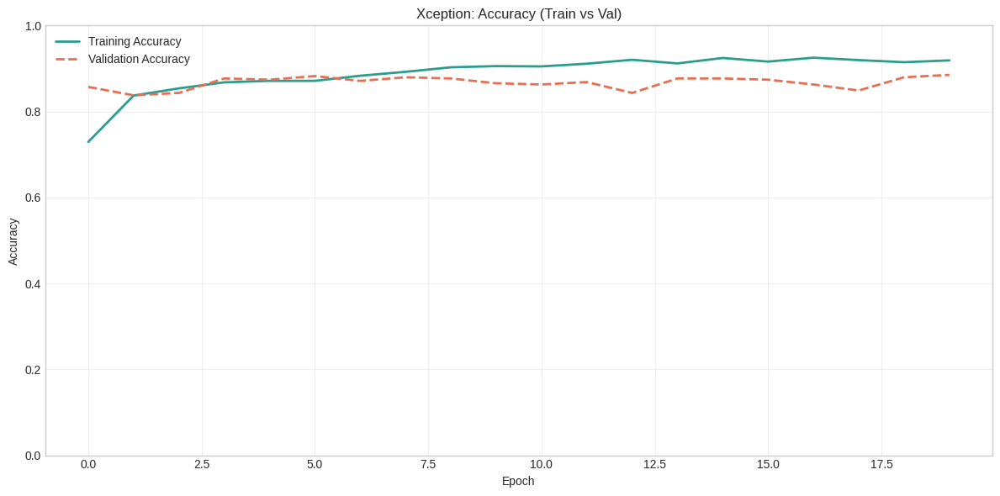

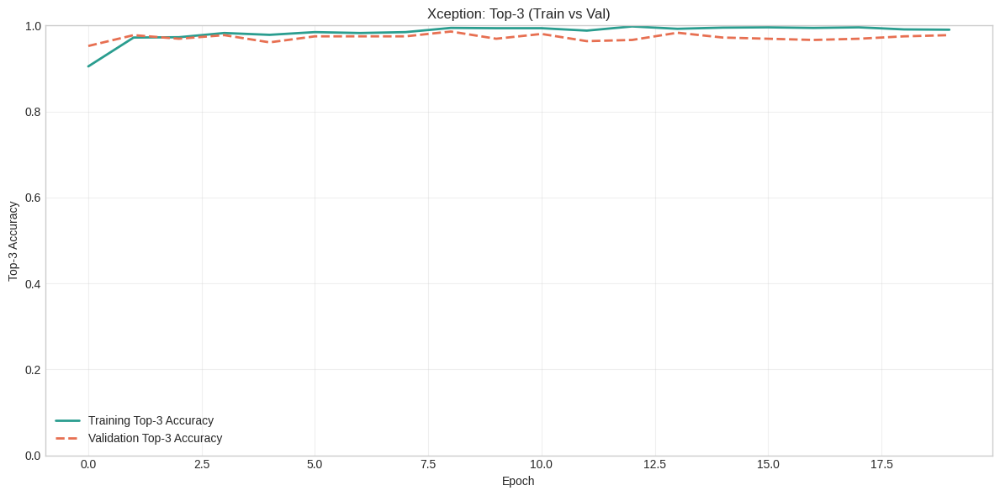

In [41]:
plot_one_metric(history_xcept, "accuracy", title="Xception: Accuracy (Train vs Val)")
plot_one_metric(history_xcept, "top3_acc", title="Xception: Top-3 (Train vs Val)")

# **Comparing CNN and Xception comparing**

In [43]:
import matplotlib.pyplot as plt

# Use a clean built-in style if available
try:
    plt.style.use('seaborn-v0_8-whitegrid')
except Exception:
    pass

def _resolve_key(H, alias):
    """Map 'accuracy'/'top3' to real history keys in H."""
    if alias == "accuracy":
        for k in ("sparse_categorical_accuracy", "categorical_accuracy", "accuracy"):
            if k in H: return k
    elif alias == "top3":
        for k in ("top3_acc", "sparse_top_k_categorical_accuracy"):
            if k in H: return k
    elif alias == "loss":
        return "loss"
    # fallback: substring search
    for k in H.keys():
        if alias in k:
            return k
    raise KeyError(f"Metric alias '{alias}' not found in history keys: {sorted(H.keys())}")

def plot_compare(histories, labels, which="val", metric="accuracy", title=None, colors=None, ylim=(0,1)):
    """
    histories: list of Keras History objects
    labels:    list of legend labels (same length)
    which:     'train' or 'val'
    metric:    'accuracy' | 'top3' | 'loss'
    """
    assert len(histories) == len(labels), "histories and labels length mismatch"

    # Find shortest length among series to align epochs
    series_list = []
    min_len = 10**9

    for H in histories:
        hdict = H.history
        mkey = _resolve_key(hdict, metric)
        key  = mkey if which == "train" else f"val_{mkey}"
        if key not in hdict:
            raise KeyError(f"'{key}' not found. Available: {sorted(hdict.keys())}")
        series = hdict[key]
        series_list.append(series)
        min_len = min(min_len, len(series))

    plt.figure(figsize=(13,10))
    if colors is None:
        colors = [None]*len(histories)  # let matplotlib pick if not provided

    for series, lab, col in zip(series_list, labels, colors):
        plt.plot(series[:min_len], label=lab, linewidth=2, color=col)

    pretty = {"accuracy":"Accuracy", "top3":"Top-3 Accuracy", "loss":"Loss"}[metric]
    which_txt = "Validation" if which=="val" else "Training"
    plt.title(title or f"{which_txt} {pretty} over epochs", fontsize=18)
    plt.xlabel("epoch"); plt.ylabel(pretty)
    if metric != "loss" and ylim:
        plt.ylim(*ylim)
    plt.grid(True, alpha=.3)
    plt.legend(loc="best")
    plt.tight_layout()
    plt.show()


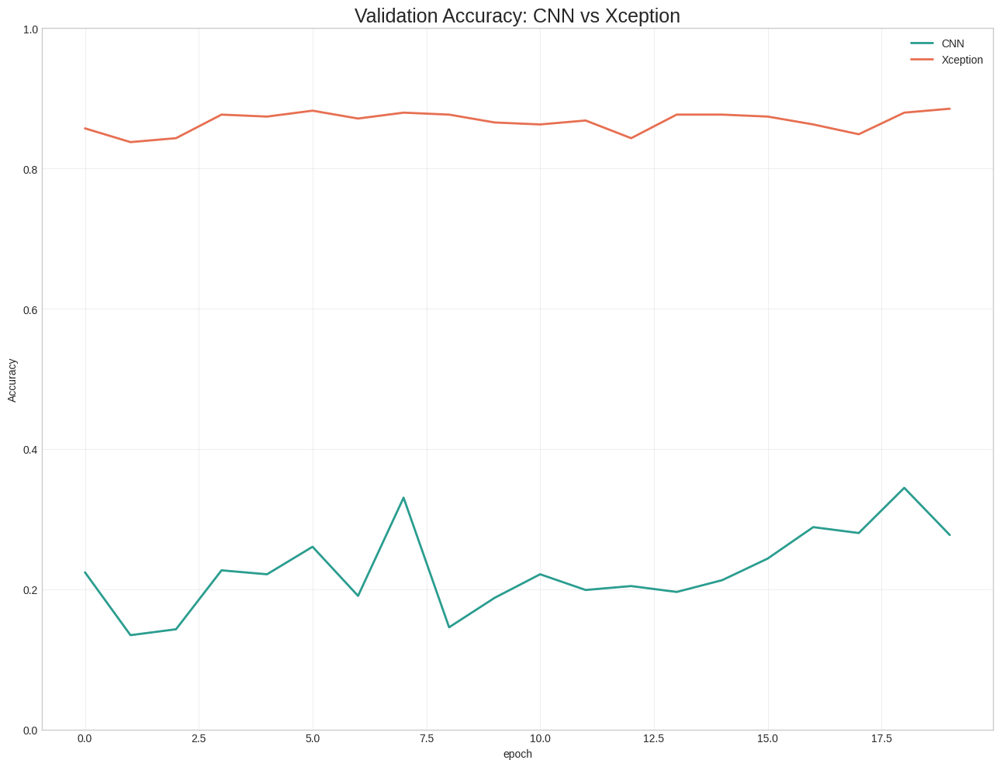

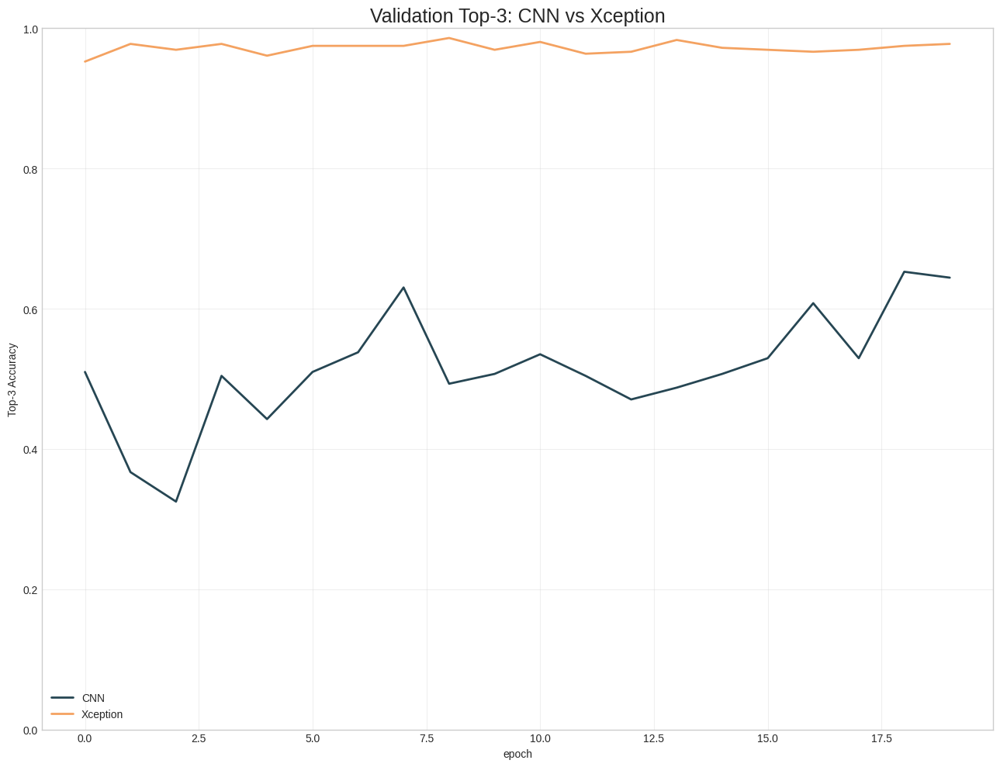

In [44]:
# 1) Validation Accuracy: CNN vs Xception
plot_compare(
    histories=[history, history_xcept],
    labels=["CNN", "Xception"],
    which="val",
    metric="accuracy",
    title="Validation Accuracy: CNN vs Xception",
    colors=["#2a9d8f", "#e76f51"]
)

# 2) Validation Top-3: CNN vs Xception
plot_compare(
    histories=[history, history_xcept],
    labels=["CNN", "Xception"],
    which="val",
    metric="top3",
    title="Validation Top-3: CNN vs Xception",
    colors=["#264653", "#f4a261"]
)


In [45]:
# Means
xcept_mean_val_acc  = float(np.mean(history_xcept.history['val_sparse_categorical_accuracy']))
xcept_mean_val_top3 = float(np.mean(history_xcept.history['val_top3_acc']))

print("-" * 50)
print("Xception base model – validation scores")
print("-" * 50)
print(f"Mean val accuracy : {xcept_mean_val_acc:.3f}")
print(f"Mean val top-3    : {xcept_mean_val_top3:.3f}")


--------------------------------------------------
Xception base model – validation scores
--------------------------------------------------
Mean val accuracy : 0.867
Mean val top-3    : 0.972


In [35]:
val_acc  = history_xcept.history['val_sparse_categorical_accuracy']
val_top3 = history_xcept.history['val_top3_acc']
val_loss = history_xcept.history['val_loss']

best_idx_acc  = int(np.argmax(val_acc))
best_idx_loss = int(np.argmin(val_loss))

print(f"Best val acc  : {val_acc[best_idx_acc]:.3f} at epoch {best_idx_acc+1}")
print(f"Best val top3 : {val_top3[best_idx_acc]:.3f} at epoch {best_idx_acc+1}")
print(f"Lowest val loss: {val_loss[best_idx_loss]:.4f} at epoch {best_idx_loss+1}")


Best val acc  : 0.885 at epoch 20
Best val top3 : 0.978 at epoch 20
Lowest val loss: 0.3288 at epoch 4


# **Xception fine tuning**

In [28]:
import tensorflow as tf
from tensorflow.keras.metrics import SparseTopKCategoricalAccuracy
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import os

# How many layers of the Xception *base* to unfreeze
UNFREEZE_LAST = 40  # try 20–60; 40 is a good start

# Unfreeze top of the conv base but keep BatchNorm frozen
for i, layer in enumerate(xception_model.layers):
    trainable_flag = (i >= len(xception_model.layers) - UNFREEZE_LAST)
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False
    else:
        layer.trainable = trainable_flag

# Recompile with small LR
my_xcept_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss="sparse_categorical_crossentropy",
    metrics=["sparse_categorical_accuracy",
             SparseTopKCategoricalAccuracy(k=3, name='top3_acc')]
)

print("Unfrozen last", UNFREEZE_LAST, "layers of Xception base (except BatchNorm).")


Unfrozen last 40 layers of Xception base (except BatchNorm).


In [29]:
ckpt_path = os.path.join(PROJECT_DIR, "xception_finetuned.keras")

callbacks = [
    EarlyStopping(monitor="val_sparse_categorical_accuracy", mode="max",
                  patience=5, restore_best_weights=True),
    ModelCheckpoint(ckpt_path, monitor="val_sparse_categorical_accuracy",
                    mode="max", save_best_only=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=2, min_lr=1e-6)
]

history_xcept_ft = my_xcept_model.fit(
    train_datagen.flow(x_train, y_train, batch_size=16, subset='training', shuffle=True),
    validation_data=train_datagen.flow(x_train, y_train, batch_size=16, subset='validation', shuffle=False),
    epochs=20,
    callbacks=callbacks,
    verbose=2
)

print("Fine-tuning done. Best model saved to:", ckpt_path)


Epoch 1/20
90/90 - 136s - 2s/step - loss: 0.1754 - sparse_categorical_accuracy: 0.9363 - top3_acc: 0.9944 - val_loss: 0.3814 - val_sparse_categorical_accuracy: 0.8768 - val_top3_acc: 0.9664 - learning_rate: 1.0000e-05
Epoch 2/20
90/90 - 60s - 664ms/step - loss: 0.1300 - sparse_categorical_accuracy: 0.9496 - top3_acc: 0.9979 - val_loss: 0.3535 - val_sparse_categorical_accuracy: 0.8739 - val_top3_acc: 0.9748 - learning_rate: 1.0000e-05
Epoch 3/20
90/90 - 50s - 557ms/step - loss: 0.1123 - sparse_categorical_accuracy: 0.9622 - top3_acc: 0.9986 - val_loss: 0.4196 - val_sparse_categorical_accuracy: 0.8796 - val_top3_acc: 0.9748 - learning_rate: 1.0000e-05
Epoch 4/20
90/90 - 58s - 641ms/step - loss: 0.1266 - sparse_categorical_accuracy: 0.9545 - top3_acc: 0.9986 - val_loss: 0.3038 - val_sparse_categorical_accuracy: 0.8936 - val_top3_acc: 0.9748 - learning_rate: 1.0000e-05
Epoch 5/20
90/90 - 62s - 691ms/step - loss: 0.0853 - sparse_categorical_accuracy: 0.9699 - top3_acc: 1.0000 - val_loss: 0.

In [30]:
# === SAVE XCEPTION FINETUNED (same folder, different names) ===
import os, json, numpy as np, pandas as pd

xcept_dir = os.path.join(PROJECT_DIR, "artifacts_xception")
os.makedirs(xcept_dir, exist_ok=True)

# 1) Model
ft_model_path = os.path.join(xcept_dir, "xception_finetuned.keras")
my_xcept_model.save(ft_model_path)

# 2) History
H_ft = history_xcept_ft.history if hasattr(history_xcept_ft, "history") else {}
with open(os.path.join(xcept_dir, "history_finetuned.json"), "w") as f:
    json.dump(H_ft, f)
pd.DataFrame(H_ft).to_csv(os.path.join(xcept_dir, "history_finetuned.csv"), index=False)

print("Saved fine-tuned model & history to:", xcept_dir)


Saved fine-tuned model & history to: /content/drive/MyDrive/stanford_dogs_colab/artifacts_xception


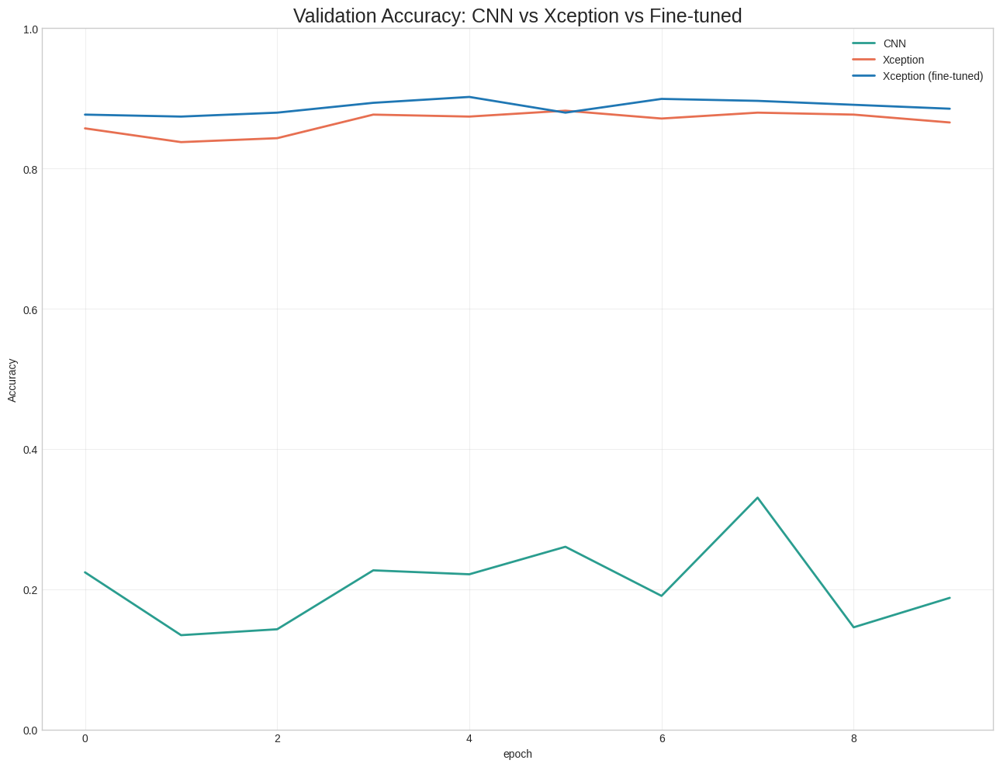

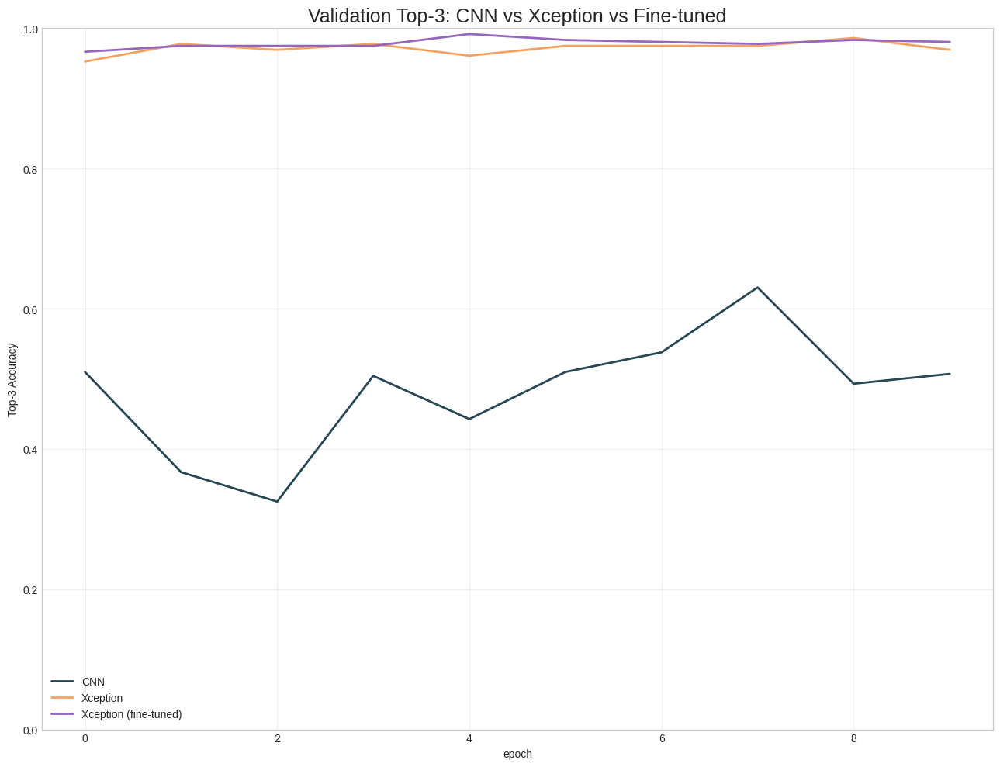

In [46]:
# 1) Validation Accuracy: CNN vs Xception vs Fine-tuned
plot_compare(
    histories=[history, history_xcept, history_xcept_ft],
    labels=["CNN", "Xception", "Xception (fine-tuned)"],
    which="val",
    metric="accuracy",
    title="Validation Accuracy: CNN vs Xception vs Fine-tuned",
    colors=["#2a9d8f", "#e76f51", "#1f77b4"]
)

# 2) Validation Top-3: CNN vs Xception vs Fine-tuned
plot_compare(
    histories=[history, history_xcept, history_xcept_ft],
    labels=["CNN", "Xception", "Xception (fine-tuned)"],
    which="val",
    metric="top3",
    title="Validation Top-3: CNN vs Xception vs Fine-tuned",
    colors=["#264653", "#f4a261", "#9467bd"]
)


# **Testing the Model on the Test Dataset**

In [47]:
from tensorflow.keras.models import load_model
import numpy as np, os

xcept_dir = os.path.join(PROJECT_DIR, "artifacts_xception")
ft_model_path = os.path.join(xcept_dir, "xception_finetuned.keras")

# Load model (we’ll re-compile to attach metrics)
xcept_ft = load_model(ft_model_path, compile=False)

# Load test split + class names
x_test = np.load(os.path.join(xcept_dir, "x_test.npy"))
y_test = np.load(os.path.join(xcept_dir, "y_test.npy"))
class_names = np.load(os.path.join(xcept_dir, "label_classes.npy"), allow_pickle=True).tolist()

print("Loaded fine-tuned model and test artifacts.",
      "\nTest shapes:", x_test.shape, y_test.shape,
      "\nNum classes:", len(class_names))


Loaded fine-tuned model and test artifacts. 
Test shapes: (447, 299, 299, 3) (447,) 
Num classes: 10


In [48]:
import tensorflow as tf
from tensorflow.keras.metrics import SparseTopKCategoricalAccuracy

xcept_ft.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["sparse_categorical_accuracy",
             SparseTopKCategoricalAccuracy(k=3, name="top3_acc")]
)

test_loss, test_acc, test_top3 = xcept_ft.evaluate(x_test, y_test, batch_size=32, verbose=0)
print(f"Fine-tuned Xception — Test loss: {test_loss:.4f} | Top-1 acc: {test_acc:.3f} | Top-3 acc: {test_top3:.3f}")


Fine-tuned Xception — Test loss: 0.3722 | Top-1 acc: 0.879 | Top-3 acc: 0.982


In [49]:
from sklearn.metrics import confusion_matrix, classification_report

y_prob = xcept_ft.predict(x_test, batch_size=32, verbose=0)
y_pred = y_prob.argmax(axis=1)

print(classification_report(y_test, y_pred, target_names=class_names))
cm = confusion_matrix(y_test, y_pred)
cm.shape, cm.sum()


                      precision    recall  f1-score   support

        Afghan_hound       0.94      0.94      0.94        49
Bernese_mountain_dog       0.98      1.00      0.99        41
      Great_Pyrenees       0.85      0.83      0.84        41
     Irish_wolfhound       0.83      0.81      0.82        53
            Leonberg       0.98      0.95      0.97        44
         Maltese_dog       0.84      0.89      0.87        47
          Pomeranian       0.97      0.90      0.93        39
             Samoyed       0.80      0.85      0.82        39
  Scottish_deerhound       0.77      0.82      0.79        44
                Shih       0.87      0.82      0.85        50

            accuracy                           0.88       447
           macro avg       0.88      0.88      0.88       447
        weighted avg       0.88      0.88      0.88       447



((10, 10), np.int64(447))

In [66]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix_counts(cm, classes, cmap='viridis', figsize=None):
    """
    Confusion matrix with RAW COUNTS (no normalization).
    - cm: sklearn.metrics.confusion_matrix result (int matrix)
    - classes: list of class names in the same order
    """
    if not isinstance(classes, list):
        classes = list(classes)
    n = len(classes)
    if figsize is None:
        figsize = (max(11, n * 0.6), 9)

    try: plt.style.use('seaborn-v0_8-white')
    except: pass

    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.set_ylabel('Count')

    ax.set_xticks(np.arange(n)); ax.set_yticks(np.arange(n))
    ax.set_xticklabels(classes, rotation=90)
    ax.set_yticklabels(classes)

    # Smart text color on heatmap
    vmax = cm.max() if cm.size else 1
    for i in range(n):
        for j in range(n):
            val = int(cm[i, j])
            rgba = im.cmap(im.norm(val / vmax if vmax > 0 else 0))
            r, g, b, _ = rgba
            lum = 0.2126*r + 0.7152*g + 0.0722*b
            txt_color = 'black' if lum > 0.6 else 'white'
            ax.text(j, i, f"{val}", ha="center", va="center", color=txt_color, fontsize=8)

    ax.set_ylabel('True label'); ax.set_xlabel('Predicted label')
    ax.grid(False)
    fig.tight_layout()
    plt.show()


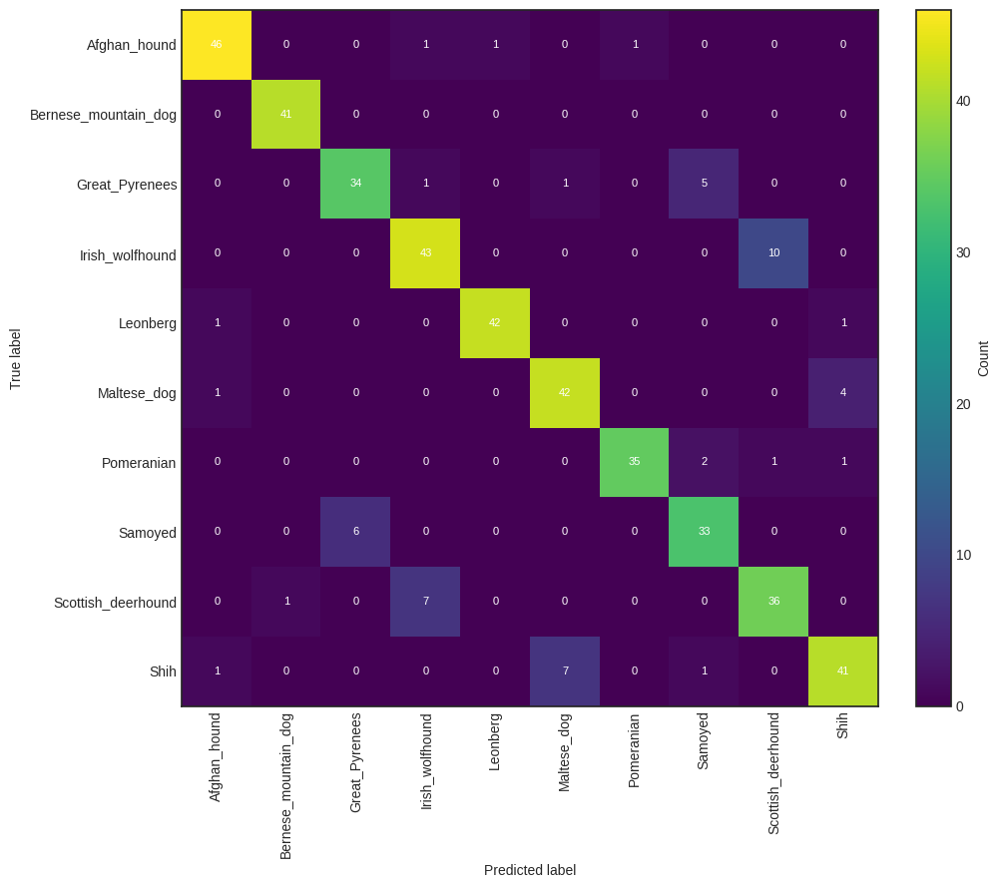

In [67]:
# Assumes you already have: cm, class_names
plot_confusion_matrix_counts(cm, class_names, cmap='viridis')


In [62]:
import matplotlib.pyplot as plt
import numpy as np

def plot_per_class_accuracy(cm, class_names, color="#2a9d8f", annotate=True):
    acc = (cm.diagonal() / np.maximum(cm.sum(axis=1), 1)).astype(float)
    overall = float(cm.diagonal().sum() / np.maximum(cm.sum(), 1))

    try: plt.style.use('seaborn-v0_8-whitegrid')
    except: pass

    plt.figure(figsize=(12,6))
    x = np.arange(len(class_names))
    plt.bar(x, acc, color=color, edgecolor="#333333")
    plt.xticks(x, class_names, rotation=90)
    plt.ylim(0, 1)
    plt.ylabel("Accuracy")
    plt.title("Per-class Accuracy (original order)")
    plt.axhline(overall, ls='--', color="#e76f51", lw=1.5, label=f"Overall: {overall:.2f}")
    if annotate:
        for i, v in enumerate(acc):
            y = v + 0.015 if v <= 0.95 else v - 0.04
            va = 'bottom' if v <= 0.95 else 'top'
            plt.text(i, y, f"{v:.2f}", ha='center', va=va, fontsize=8)
    plt.legend()
    plt.tight_layout()
    plt.show()

# usage:
# plot_per_class_accuracy(cm, class_names, color="#2a9d8f", annotate=True)


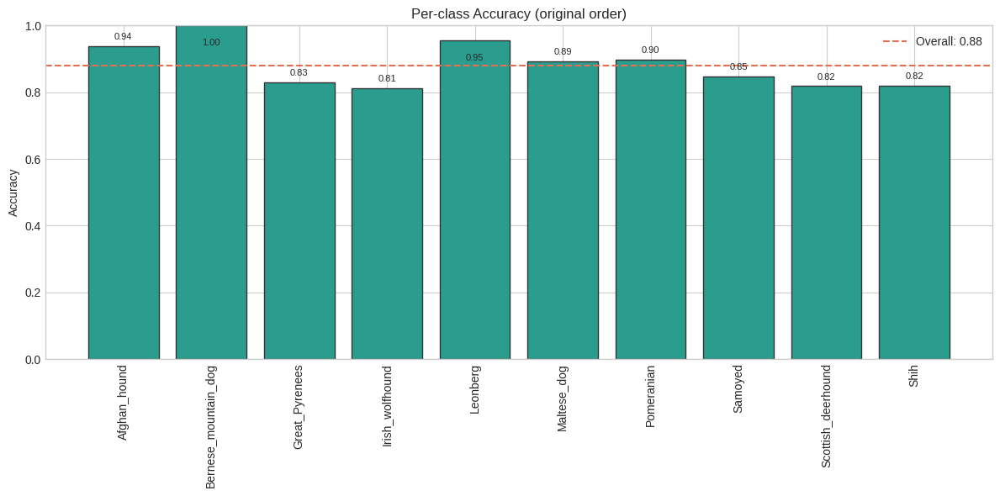

In [63]:
plot_per_class_accuracy(cm, class_names, color="#2a9d8f", annotate=True)


In [65]:
# === Test accuracy for the fine-tuned Xception ===
from tensorflow.keras.models import load_model
import os

best_path = os.path.join(PROJECT_DIR, "xception_finetuned.keras")  # change if you saved elsewhere
model = load_model(best_path, compile=False)
model.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["sparse_categorical_accuracy"])

_, test_acc = model.evaluate(x_test, y_test, batch_size=32, verbose=0)
print(f"Final TEST accuracy : {test_acc:.4f}")


Final TEST accuracy : 0.8792


In [68]:
# Predict on test set (fine-tuned Xception already loaded as xcept_ft)
y_prob = xcept_ft.predict(x_test, batch_size=32, verbose=0)
y_pred = y_prob.argmax(axis=1)

# Make sure class_names is a list
class_names = list(class_names)

# String labels for readability
y_test_s = np.array([class_names[i] for i in y_test])
y_pred_s = np.array([class_names[i] for i in y_pred])


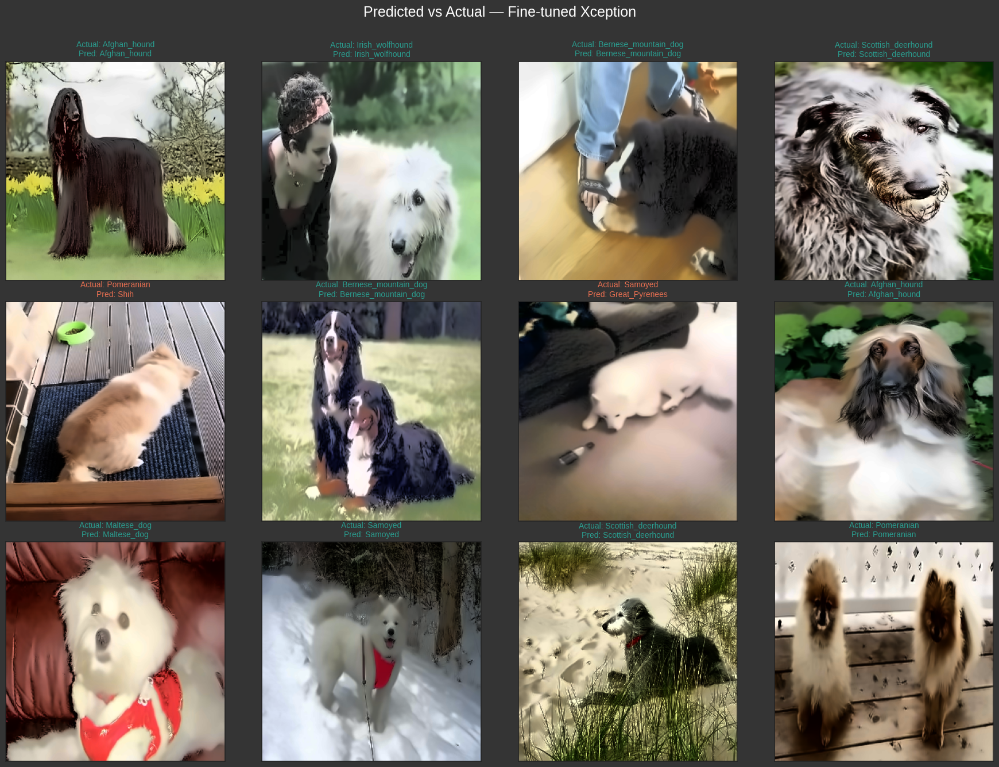

In [69]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

idxs = np.random.choice(len(x_test), size=12, replace=False)

fig, axes = plt.subplots(3, 4, figsize=(18, 14))
fig.patch.set_facecolor('#343434')
fig.suptitle("Predicted vs Actual — Fine-tuned Xception", y=.95, fontsize=18, color="white")

for ax, idx in zip(axes.ravel(), idxs):
    ax.imshow(image.array_to_img(x_test[idx]))
    correct = (y_pred[idx] == y_test[idx])
    ax.set_title(
        f"Actual: {y_test_s[idx]}\nPred: {y_pred_s[idx]}",
        color=("#2a9d8f" if correct else "#e76f51"),  # green if correct, coral if wrong
        fontsize=10
    )
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.show()
